In [2]:
!pip3 install transformers


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip3 install --upgrade pip


In [ ]:
!wget -nc "https://lazyprogrammer.me/course_files/AirlineTweets.csv"

--2024-08-02 06:01:34--  https://lazyprogrammer.me/course_files/AirlineTweets.csv
Resolving lazyprogrammer.me (lazyprogrammer.me)... 104.21.23.210, 172.67.213.166, 2606:4700:3031::6815:17d2, ...
Connecting to lazyprogrammer.me (lazyprogrammer.me)|104.21.23.210|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3421431 (3.3M) [text/csv]
Saving to: ‘AirlineTweets.csv’

AirlineTweets.csv   100%[===================>]   3.26M  12.4MB/s    in 0.3s    

2024-08-02 06:01:35 (12.4 MB/s) - ‘AirlineTweets.csv’ saved [3421431/3421431]



In [3]:
from transformers import pipeline
import tf_keras as keras
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split

In [ ]:
classifier = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [ ]:
type(classifier)

transformers.pipelines.text_classification.TextClassificationPipeline

In [ ]:
import torch

In [ ]:
torch.cuda.is_available()

True

In [ ]:
torch.cuda.current_device()

0

In [ ]:
df_ = pd.read_csv('AirlineTweets.csv')
df_.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


<Axes: >

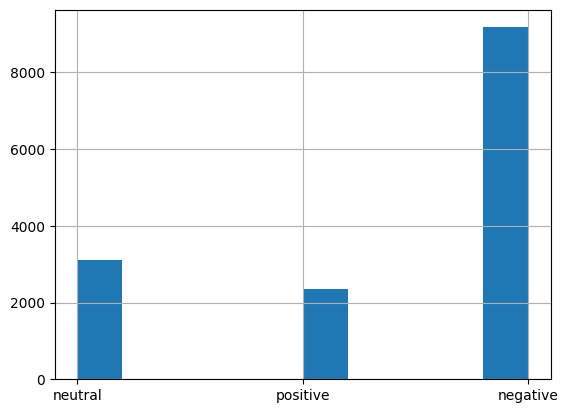

In [ ]:
df = df_[['airline_sentiment', 'text']].copy()
df['airline_sentiment'].hist()

In [ ]:
df = df[df.airline_sentiment != 'neutral'].copy()

In [ ]:
target_map = {'positive':1, 'negative':0}
df['target'] = df['airline_sentiment'].map(target_map)
df.head()

,airline_sentiment,text,target
1,positive,@VirginAmerica plus you've added commercials t...,1
3,negative,@VirginAmerica it's really aggressive to blast...,0
4,negative,@VirginAmerica and it's a really big bad thing...,0
5,negative,@VirginAmerica seriously would pay $30 a fligh...,0
6,positive,"@VirginAmerica yes, nearly every time I fly VX...",1


In [ ]:
len(df)

11541

In [ ]:
texts = df['text'].tolist()
predictions = classifier(texts)

In [ ]:
predictions

[{'label': 'POSITIVE', 'score': 0.6070854663848877},
 {'label': 'NEGATIVE', 'score': 0.9973449110984802},
 {'label': 'NEGATIVE', 'score': 0.9995823502540588},
 {'label': 'NEGATIVE', 'score': 0.9854251742362976},
 {'label': 'POSITIVE', 'score': 0.9553210139274597},
 {'label': 'POSITIVE', 'score': 0.9827088117599487},
 {'label': 'POSITIVE', 'score': 0.9994851350784302},
 {'label': 'POSITIVE', 'score': 0.9993509650230408},
 {'label': 'POSITIVE', 'score': 0.9940821528434753},
 {'label': 'POSITIVE', 'score': 0.9863133430480957},
 {'label': 'POSITIVE', 'score': 0.9996304512023926},
 {'label': 'NEGATIVE', 'score': 0.9980512857437134},
 {'label': 'POSITIVE', 'score': 0.9964436888694763},
 {'label': 'NEGATIVE', 'score': 0.9968666434288025},
 {'label': 'POSITIVE', 'score': 0.9787647724151611},
 {'label': 'POSITIVE', 'score': 0.9995218515396118},
 {'label': 'NEGATIVE', 'score': 0.9954516291618347},
 {'label': 'POSITIVE', 'score': 0.9995624423027039},
 {'label': 'POSITIVE', 'score': 0.999874830245

In [ ]:
probs = [d['score'] if d['label'].startswith('P') else 1 - d['score'] for d in predictions]

In [ ]:
probs

[0.6070854663848877,
 0.0026550889015197754,
 0.0004176497459411621,
 0.014574825763702393,
 0.9553210139274597,
 0.9827088117599487,
 0.9994851350784302,
 0.9993509650230408,
 0.9940821528434753,
 0.9863133430480957,
 0.9996304512023926,
 0.001948714256286621,
 0.9964436888694763,
 0.0031333565711975098,
 0.9787647724151611,
 0.9995218515396118,
 0.004548370838165283,
 0.9995624423027039,
 0.9998748302459717,
 0.004880666732788086,
 0.0004048943519592285,
 0.0006322264671325684,
 0.01542818546295166,
 0.01828092336654663,
 0.0004482865333557129,
 0.0023748278617858887,
 0.9934479594230652,
 0.9976067543029785,
 0.8661720752716064,
 0.0003237724304199219,
 0.841560423374176,
 0.0032317638397216797,
 0.9997846484184265,
 0.17614644765853882,
 0.9993895292282104,
 0.09156608581542969,
 0.004861593246459961,
 0.9997820258140564,
 0.0014235973358154297,
 0.004673957824707031,
 0.00464242696762085,
 0.019041001796722412,
 0.9911696910858154,
 0.0125504732131958,
 0.00809931755065918,
 0.999

In [ ]:
preds = [1 if d['label'].startswith('P') else 0 for d in predictions]

In [ ]:
preds = np.array(preds)

In [ ]:
print('Accuracy =', np.mean(df['target'] == preds))

Accuracy = 0.8898708950697514


In [ ]:
cm = confusion_matrix(df['target'], preds, normalize='true')
cm

array([[0.90117673, 0.09882327],
       [0.15404147, 0.84595853]])

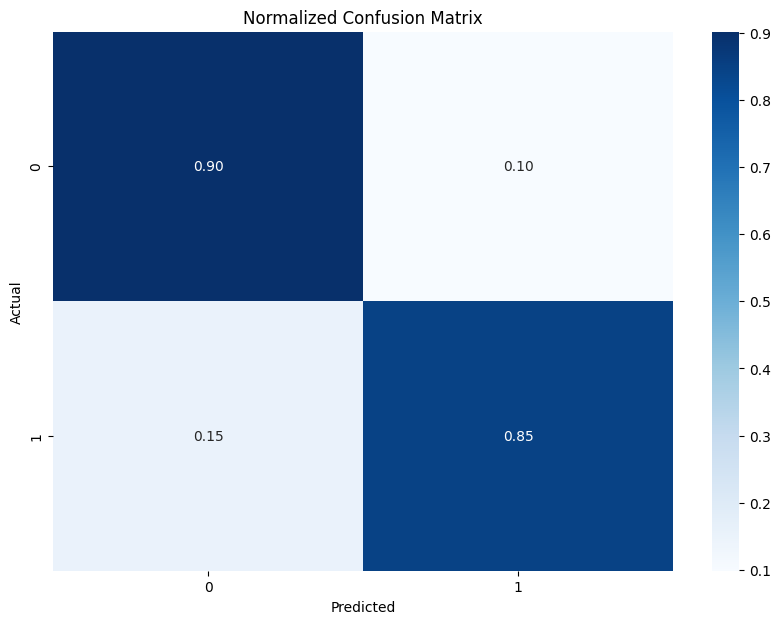

In [ ]:
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=np.unique(df['target']), yticklabels=np.unique(df['target']))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Normalized Confusion Matrix')
plt.show()

In [ ]:
f1_score(df['target'], preds)

0.7587777566900741

In [ ]:
f1_score(1 - df['target'], 1-preds)

0.928647616908999

In [ ]:
roc_auc_score(df['target'],probs)

0.9485934690648773

In [ ]:
roc_auc_score(1-df['target'], 1-np.array(probs))

0.9485934690648773

Embeddings and Semantic

In [6]:
featurizer = pipeline('feature-extraction')

No model was supplied, defaulted to distilbert/distilbert-base-cased and revision 935ac13 (https://huggingface.co/distilbert/distilbert-base-cased).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.bias']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTor

In [7]:
!wget -nc https://lazyprogrammer.me/course_files/nlp/bbc_text_cls.csv

--2024-08-02 12:42:02--  https://lazyprogrammer.me/course_files/nlp/bbc_text_cls.csv
Resolving lazyprogrammer.me (lazyprogrammer.me)... 2606:4700:3031::6815:17d2, 2606:4700:3030::ac43:d5a6, 104.21.23.210, ...
Connecting to lazyprogrammer.me (lazyprogrammer.me)|2606:4700:3031::6815:17d2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5085081 (4.8M) [text/csv]
Saving to: ‘bbc_text_cls.csv’

bbc_text_cls.csv    100%[===================>]   4.85M   343KB/s    in 18s     

2024-08-02 12:42:23 (270 KB/s) - ‘bbc_text_cls.csv’ saved [5085081/5085081]



In [8]:
df = pd.read_csv('bbc_text_cls.csv')
df.head()

,text,labels
0,Ad sales boost Time Warner profit\n\nQuarterly...,business
1,Dollar gains on Greenspan speech\n\nThe dollar...,business
2,Yukos unit buyer faces loan claim\n\nThe owner...,business
3,High fuel prices hit BA's profits\n\nBritish A...,business
4,Pernod takeover talk lifts Domecq\n\nShares in...,business


In [9]:
 df.shape

(2225, 2)

In [10]:
result = featurizer(''.join(df.iloc[0].text.split()[:250]))
result

[[[0.23137900233268738,
   0.070570208132267,
   -0.1917610913515091,
   -0.07435266673564911,
   -0.19559475779533386,
   -0.08547518402338028,
   0.39542850852012634,
   -0.16679546236991882,
   0.028139431029558182,
   -1.0710861682891846,
   -0.1733064502477646,
   0.10723388195037842,
   0.15088003873825073,
   -0.36895859241485596,
   -0.4823024868965149,
   0.3105083703994751,
   0.04696876183152199,
   -0.1387788951396942,
   -0.31943565607070923,
   -0.23571550846099854,
   0.23596571385860443,
   -0.11021329462528229,
   0.5420649647712708,
   -0.2839423418045044,
   0.19550815224647522,
   0.09815046191215515,
   0.14925256371498108,
   0.05802839994430542,
   -0.42333829402923584,
   0.3770381808280945,
   -0.11108485609292984,
   0.27307143807411194,
   -0.009199684485793114,
   -0.11242049932479858,
   -0.253014475107193,
   0.2619340419769287,
   0.08741522580385208,
   -0.5294182300567627,
   -0.06288032978773117,
   0.029811672866344452,
   -0.4804280400276184,
   0.29

In [11]:
type(result)

list

In [12]:
len(result)

1

In [13]:
type(result[0])

list

In [14]:
type(result[0][0])

list

In [15]:
result[0][0][0]

0.23137900233268738

In [16]:
r_np = np.array(result)
r_np.shape

(1, 505, 768)

In [17]:
results = featurizer([''.join(text.split()[:250]) for text in df.iloc[:5].text])

In [18]:
len(results)

5

In [19]:
np.array(results[0]).shape

(1, 505, 768)

In [20]:
np.array(results[1]).shape

(1, 383, 768)

In [21]:
np.array(results[2]).shape

(1, 367, 768)

In [22]:
len(df.iloc[0].text.split())

421

In [23]:
len(df.iloc[1].text.split())

384

In [24]:
len(df.iloc[2].text.split())

264

In [25]:
lens = [len(a.split()) for a in df.text]
lens

[421,
 384,
 264,
 406,
 265,
 184,
 284,
 321,
 229,
 227,
 185,
 300,
 299,
 466,
 606,
 247,
 213,
 175,
 270,
 658,
 350,
 306,
 208,
 328,
 455,
 297,
 274,
 211,
 403,
 415,
 304,
 278,
 226,
 308,
 199,
 349,
 419,
 153,
 210,
 229,
 328,
 228,
 193,
 404,
 311,
 293,
 274,
 265,
 617,
 308,
 295,
 484,
 236,
 254,
 365,
 262,
 440,
 198,
 294,
 143,
 266,
 319,
 289,
 291,
 355,
 319,
 294,
 389,
 536,
 184,
 206,
 278,
 253,
 254,
 214,
 282,
 443,
 260,
 250,
 191,
 265,
 207,
 534,
 210,
 228,
 191,
 294,
 194,
 376,
 377,
 314,
 361,
 315,
 210,
 264,
 140,
 444,
 217,
 430,
 342,
 352,
 227,
 478,
 369,
 227,
 305,
 295,
 171,
 149,
 269,
 527,
 287,
 370,
 351,
 203,
 235,
 420,
 221,
 456,
 302,
 520,
 386,
 191,
 171,
 242,
 371,
 481,
 303,
 162,
 422,
 446,
 216,
 281,
 364,
 404,
 535,
 219,
 313,
 307,
 442,
 260,
 339,
 263,
 159,
 252,
 875,
 209,
 259,
 595,
 365,
 287,
 332,
 400,
 360,
 268,
 284,
 271,
 160,
 634,
 387,
 366,
 291,
 441,
 414,
 363,
 264,
 213

(array([1.833e+03, 3.650e+02, 1.800e+01, 2.000e+00, 0.000e+00, 3.000e+00,
        1.000e+00, 2.000e+00, 0.000e+00, 1.000e+00]),
 array([  89. ,  523.3,  957.6, 1391.9, 1826.2, 2260.5, 2694.8, 3129.1,
        3563.4, 3997.7, 4432. ]),
 <BarContainer object of 10 artists>)

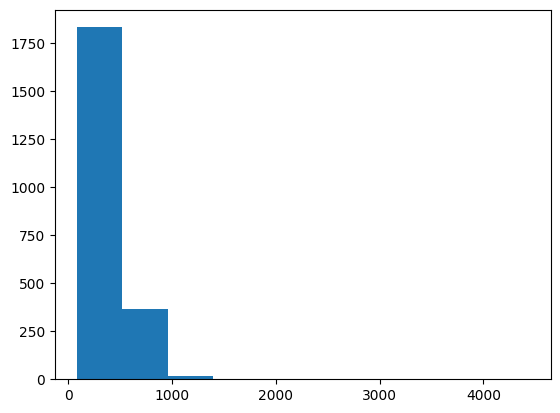

In [26]:
plt.hist(lens)

In [27]:
np.max(lens)

4432

In [28]:
texts = [''.join(a.split()[:100]) for a in df.text]

In [29]:
embeddings = featurizer(texts)

In [30]:
embeddings = [e[0][0] for e in embeddings]
# embeddings = [np.array(e[0]).mean(axis=0) for e in embeddings]

In [31]:
embeddings = np.array(embeddings)
embeddings.shape

(2225, 768)

In [32]:
from sklearn.neighbors import NearestNeighbors

In [33]:
model = NearestNeighbors(metric='cosine')
model.fit(embeddings)

NearestNeighbors(metric='cosine')

In [34]:
distances, indices = model.kneighbors(embeddings[10].reshape(1,-1))

In [35]:
distances

array([[0.        , 0.00506224, 0.00622212, 0.00624547, 0.00636149]])

In [36]:
indices

array([[ 10,   1, 609, 119, 844]])

In [37]:
df.iloc[10].text

"Ask Jeeves tips online ad revival\n\nAsk Jeeves has become the third leading online search firm this week to thank a revival in internet advertising for improving fortunes.\n\nThe firm's revenue nearly tripled in the fourth quarter of 2004, exceeding $86m (£46m). Ask Jeeves, once among the best-known names on the web, is now a relatively modest player. Its $17m profit for the quarter was dwarfed by the $204m announced by rival Google earlier in the week. During the same quarter, Yahoo earned $187m, again tipping a resurgence in online advertising.\n\nThe trend has taken hold relatively quickly. Late last year, marketing company Doubleclick, one of the leading providers of online advertising, warned that some or all of its business would have to be put up for sale. But on Thursday, it announced that a sharp turnaround had brought about an unexpected increase in profits. Neither Ask Jeeves nor Doubleclick thrilled investors with their profit news, however. In both cases, their shares fe

In [38]:
df.iloc[10].labels

'business'

In [39]:
df.iloc[1].text

'Dollar gains on Greenspan speech\n\nThe dollar has hit its highest level against the euro in almost three months after the Federal Reserve head said the US trade deficit is set to stabilise.\n\nAnd Alan Greenspan highlighted the US government\'s willingness to curb spending and rising household savings as factors which may help to reduce it. In late trading in New York, the dollar reached $1.2871 against the euro, from $1.2974 on Thursday. Market concerns about the deficit has hit the greenback in recent months. On Friday, Federal Reserve chairman Mr Greenspan\'s speech in London ahead of the meeting of G7 finance ministers sent the dollar higher after it had earlier tumbled on the back of worse-than-expected US jobs data. "I think the chairman\'s taking a much more sanguine view on the current account deficit than he\'s taken for some time," said Robert Sinche, head of currency strategy at Bank of America in New York. "He\'s taking a longer-term view, laying out a set of conditions u

In [40]:
df.iloc[1].labels

'business'

In [41]:
df.iloc[609].text

'Fockers retain film chart crown\n\nComedy Meet The Fockers has held on to the number one spot at the North American box office for a second week.\n\nIt took $42.8m (£23.7m) at the weekend, making its overall takings more than $163m (£90m) in 12 days, according to studio estimates. It took $19.1m (£9.9m) on Christmas Day alone, the highest takings on that day in box office history. The sequel to the Ben Stiller comedy Meet The Parents stars Robert De Niro, Dustin Hoffman and Barbra Streisand. The success of Meet the Fockers could help produce record box office revenue for 2004, said Paul Dergarabedian, president of the industry\'s tracker Exhibitor Relations. "We\'ve had a much stronger than anticipated final week of the year that helped the industry end on a high note," said Mr Dergarabedian.\n\nMeet the Fockers also broke the box office records for the most money taken on New Year\'s Eve, when it made $12.2m (£6.2m), and New Year\'s Day, when it took $18m (£9.4m). The previous New Ye

In [42]:
df.iloc[1].labels

'business'

In [43]:
query = featurizer("TV and film")
len(query)

1

In [44]:
len(query[0])

5

In [45]:
len(query[0][0])

768

In [46]:
distances, indices = model.kneighbors(np.array(query[0][0]).reshape(1,-1))

In [47]:
distances

array([[0.03657156, 0.03694842, 0.03792381, 0.03806926, 0.03889206]])

In [48]:
indices

array([[2039, 1153, 2183,  551,  346]])

In [49]:
df.iloc[2039].text

'TV future in the hands of viewers\n\nWith home theatre systems, plasma high-definition TVs, and digital video recorders moving into the living room, the way people watch TV will be radically different in five years\' time.\n\nThat is according to an expert panel which gathered at the annual Consumer Electronics Show in Las Vegas to discuss how these new technologies will impact one of our favourite pastimes. With the US leading the trend, programmes and other content will be delivered to viewers via home networks, through cable, satellite, telecoms companies, and broadband service providers to front rooms and portable devices.\n\nOne of the most talked-about technologies of CES has been digital and personal video recorders (DVR and PVR). These set-top boxes, like the US\'s TiVo and the UK\'s Sky+ system, allow people to record, store, play, pause and forward wind TV programmes when they want.\n\nEssentially, the technology allows for much more personalised TV. They are also being buil

In [51]:
df.iloc[2039].labels

'tech'

In [52]:
df.iloc[1153].text

'Labour MPs\' fears over squabbling\n\nIf there is one thing certain to stiffen the spines of Labour MPs it is the prospect of losing their seats at a general election.\n\nAnd it was largely that fear that led to Tony Blair and Gordon Brown being read the riot act during a meeting of the parliamentary Labour party. The views expressed by both backbenchers and Labour peers over the claimed squabbling between the two men starkly demonstrated the widely-held view within the Labour party that the two most powerful figures in the government are jeopardising the next election. As one hugely-disgruntled backbencher said before the meeting: "It is time they realised it\'s not just my seat they are threatening but if they go on like this they could put the election in doubt." It is a sentiment that is now running throughout the Labour benches with MPs eager to underline the message to their leaders to stop the squabbling and get on with the job at hand.\n\nAs Paul Flynn said: "What has deeply u

In [53]:
df.iloc[2183].text

'Confusion over high-definition TV\n\nNow that a critical mass of people have embraced digital TV, DVDs, and digital video recorders, the next revolution for TV is being prepared for our sets.\n\nIn most corners of TV and technology industries, high-definition (HDTV) is being heralded as the biggest thing to happen to the television since colour. HD essentially makes TV picture quality at least four times better than now. But there is real concern that people are not getting the right information about HD on the High Street. Thousands of flat panel screens - LCDs (liquid crystal displays), plasma screens, and DLP rear-projection TV sets - have already been sold as "HD", but are in fact not able to display HD.\n\n"The UK is the largest display market in Europe," according to John Binks, director of GfK, which monitors global consumer markets.\n\nBut, he added: "Of all the flat panel screens sold, just 1.3% in the UK are capable of getting high-definition." There are 74 different devices

In [54]:
df.iloc[551].text

'Berlin honours S Korean director\n\nSouth Korean film director Im Kwon-Taek has received an honorary Golden Bear at the Berlin Film Festival.\n\nIm, who has made more than 100 films in a 40-year career, was hailed for his "remarkable visual beauty, technical innovation, and intellectual depth". Twenty of his films are screening in a special retrospective during the festival, which runs until 20 February. The veteran film-maker, 68, won the best director prize at the Cannes Film Festival in 2002 for Chihwaseon. "Although his films vary in style, they all bear his unmistakable stamp: they are forceful and charged cinematographically, as well as reticent, stylised and musical," organisers said in a statement. Meanwhile, a film version of Bizet\'s opera Carmen - translated into the South African language Xhosa - has received a warm reception at the festival. U-Carmen eKhayelitsha (Carmen in Khayelitsha), which is one of 21 films up for Berlin\'s top prize, the Golden Bear, is British dire

In [55]:
df.iloc[346].text

'India-Pakistan peace boosts trade\n\nCalmer relations between India and Pakistan are paying economic dividends, with new figures showing bilateral trade up threefold in the summer.\n\nThe value of trade in April-July rose to $186.3m (£97m) from $64.4m in the same period in 2003, the Indian Government said. Nonethless, the figures represent less than 1% of India\'s overall exports. But business is expected to be boosted further from 2006 when the South Asian Free Trade Area Agreement starts. Both countries eased travel and other restrictions as part of the peace process aimed at ending nearly six decades of hostilities.\n\nSugar, plastics, pharmaceutical products and tea are among the major exports from India to its neighbour, while firms in Pakistani have been selling fabrics, fruit and spices. "If the positive trend continues, two-way trade could well cross half a billion dollars this fiscal year," India\'s federal commerce Minister Kamal Nath said. According to official data, the va

In [56]:
df.iloc[346].labels

'business'